In [1]:
#! pip install ultralytics 
#! pip install psycopg2
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from ultralytics import YOLO
import psycopg2
import im_utils
import db_ops
import pandas as pd

import boto3
s3_client = boto3.client('s3')

Connecting to the PostgreSQL database...
Connection successful


#### Get the full list of OLM images

In [2]:
objects = s3_client.list_objects_v2(Bucket='olm-processed-s3')

In [4]:
box_files = [dict['Key'].split('/')[-1].split('-')[0] for dict in objects['Contents'] if 'boxes' in dict['Key']]
box_files  = set(box_files )

In [5]:
query = f'''
SELECT *
FROM brand
ORDER BY brand_name DESC
'''
brand_df = db_ops.select_to_pandas(query, True, True)
brand_df.head(3)

/home/ubuntu/workspace/litter-imagery-brand-recognition/db_ops.py:57: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql_query(query, connection)


In [6]:
image_uri['brand_id'] = image_uri['brand_id'].fillna(value = 111).astype(int)
image_uri['cat_id'] = image_uri['cat_id'].fillna(value = 20).astype(int)
image_uri['file'] = image_uri['uri'].apply(lambda x: x.split('/')[-1].split('.')[0])
len(image_uri)

27388

In [7]:
image_uri = image_uri[~image_uri['file'].isin(box_files)]
len(image_uri)

26799

#### Load the label/no-label classifier model

In [8]:
model = YOLO('/home/ubuntu/box_model/best.pt')

#### Copy the image from the original S3, resize it, save to the procesed S3

In [ ]:
for i in range(len(image_uri)):
    print('-'*30)
    try:
        original_im_uri = image_uri['uri'].iloc[i]
        image_id = image_uri['image_id'].iloc[i]
        brand_id = image_uri['brand_id'].iloc[i]
        cat_id = image_uri['cat_id'].iloc[i]
        tmp_im_folder = '/home/ubuntu/temp-images'
        im_file = original_im_uri.split('/')[-1]
        scaled_im_uri = original_im_uri.replace('-pics-s3', '-processed-s3/scaled').split('.')[0] + '.jpg'
        scaled_im_local_path = os.path.join(tmp_im_folder, 'scaled', im_file.split('.')[0] + '.jpg')
        boxes_s3_path = scaled_im_uri.replace(im_file,'').replace('/scaled', '/boxes')
        
        os.system(f"aws s3 cp {original_im_uri} {tmp_im_folder}")  
        image_original = cv2.imread(tmp_im_folder+'/'+im_file)
        image_scaled = im_utils.ScaleImage(image_original, width = 640)
        cv2.imwrite(scaled_im_local_path, image_scaled)
    
        # Run the model inference on the test images
        results = model(scaled_im_local_path, conf = 0.2)
    
        # Set up the dataframe fo the boxes
        boxes_df = pd.DataFrame(columns = ['image_id', 'brand_id', 'cat_id', 'xmin_coord', 'ymin_coord', 'xmax_coord', 'ymax_coord', 'box_pic_uri'])
        for result in results: # Iterate over each picture 
            # Find the saceling factor
            w_ratio = image_original.shape[1]/image_scaled.shape[1]
            h_ratio = image_original.shape[0]/image_scaled.shape[0]
            for prediction in result.boxes.xyxy:   # Iterate over each box
                # Get the coordinates of the box on the original image
                xmin, ymin, xmax, ymax = map(int, prediction) 
                xmin = int(xmin * w_ratio)
                xmax = int(xmax * w_ratio)
                ymin = int(ymin * h_ratio)
                ymax = int(ymax * h_ratio)
                postfix = f"-{xmin}-{ymin}-{xmax}-{ymax}"
                box_file = im_file.split('.')[0]+postfix+'.jpg' 
                #print(box_file)
                # Get the section of the original image that is in the box
                box_im = image_original[ymin:ymax, xmin:xmax,:]
                # Save the box as an individual file
                cv2.imwrite(tmp_im_folder + '/scaled/' + box_file, box_im)
                idx = len(boxes_df)
                boxes_df.loc[idx, 'brand_id'] = brand_id
                boxes_df.loc[idx, 'cat_id'] = cat_id
                boxes_df.loc[idx, 'xmin_coord'] = xmin
                boxes_df.loc[idx, 'ymin_coord'] = ymin
                boxes_df.loc[idx, 'xmax_coord'] = xmax
                boxes_df.loc[idx, 'ymax_coord'] = ymax
                boxes_df.loc[idx, 'image_id']= image_id
                boxes_df.loc[idx, 'box_pic_uri']= boxes_s3_path + box_file
                os.system(f"aws s3 cp {tmp_im_folder + '/scaled/' + box_file} {boxes_s3_path}") 
            # Create a plot
            #plt.figure(figsize=(10, 10))
            #plt.imshow(box_im)
            #plt.axis('off') # Hide the axis
            #plt.show()
        query = f'''
        DELETE FROM box
        WHERE image_id = {image_id}
        '''
        db_ops.run_single_query(query)
        db_ops.add_df(boxes_df, "box")
        os.system(f"find ~/temp-images/ -maxdepth 2 -type f -delete")
    except Exception as e:
        print(e)

------------------------------
download: s3://olm-pics-s3/112/69M58FGWNVp1ZTObF0YmkMfGNEz1nUu1B2MSI8Gt.jpeg to ../../temp-images/69M58FGWNVp1ZTObF0YmkMfGNEz1nUu1B2MSI8Gt.jpeg

image 1/1 /home/ubuntu/temp-images/scaled/69M58FGWNVp1ZTObF0YmkMfGNEz1nUu1B2MSI8Gt.jpg: 640x640 (no detections), 48.0ms
Speed: 1.6ms preprocess, 48.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)
------------------------------
download: s3://olm-pics-s3/112/pUY1im8pNbPUAceAv17T5SCvmwK8KIAmVatpCN2o.jpeg to ../../temp-images/pUY1im8pNbPUAceAv17T5SCvmwK8KIAmVatpCN2o.jpeg

image 1/1 /home/ubuntu/temp-images/scaled/pUY1im8pNbPUAceAv17T5SCvmwK8KIAmVatpCN2o.jpg: 640x640 (no detections), 47.5ms
Speed: 1.6ms preprocess, 47.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)
------------------------------
download: s3://olm-pics-s3/628/QOH8WbXGYXyM1h8JUN0F1ep6JLOE1ochA6qu8Y8C.jpeg to ../../temp-images/QOH8WbXGYXyM1h8JUN0F1ep6JLOE1ochA6qu8Y8C.jpeg

image 1/1 /home/ubuntu/temp-images/sca

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/04/26/Camera" does not exist
[ WARN:0@2949.671] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/Camera'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/04/27/Camera" does not exist
[ WARN:0@2950.229] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/Camera'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/02/25/KBfXWAwyvz5Bp6Yew3MR2Xd50ISJmRYvudMvhHJp.jpeg to ../../temp-images/KBfXWAwyvz5Bp6Yew3MR2Xd50ISJmRYvudMvhHJp.jpeg

image 1/1 /home/ubuntu/temp-images/scaled/KBfXWAwyvz5Bp6Yew3MR2Xd50ISJmRYvudMvhHJp.jpg: 480x640 1 logo, 34.0ms
Speed: 1.3ms preprocess, 34.0ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)
upload: ../../temp-images/scaled/KBfXWAwyvz5Bp6Yew3MR2Xd50ISJmRYvudMvhHJp-1865-760-2307-1228.jpg to s3://olm-processed-s3/boxes/2020/02/25/KBfXWAwyvz5Bp6Yew3MR2Xd50ISJmRYvudMvhHJp.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2495','111','167','1865','760','2307','1228','s3://olm-processed-s3/boxes/2020/02/25/KBfXWAwyvz5Bp6Yew3MR2Xd50ISJmRYvudMvhHJp.jpgKBfXWAwyvz5Bp6Yew3MR2Xd50ISJmRYvudMvhHJp-1865-760-2307-1228.jpg');
------------------------------
download: s3://olm-pics-s3/2020/05/01/Adjustmen

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/02/Camera" does not exist
[ WARN:0@2967.345] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/Camera'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/07/MjAyMDowNTowNyAxNTo0OToxNQ%3D%3D.jpg" does not exist
[ WARN:0@2967.917] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNTowNyAxNTo0OToxNQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/07/MjAyMDowNTowNyAxNjowMjoyNA%3D%3D.jpg" does not exist
[ WARN:0@2968.483] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNTowNyAxNjowMjoyNA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/05/07/DSCN6788.JPG to ../../temp-images/DSCN6788.JPG

image 1/1 /home/ubuntu/temp-images/scaled/DSCN6788.jpg: 480x640 1 logo, 35.3ms
Speed: 1.3ms preprocess, 35.3ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)
upload: ../../temp-images/scaled/DSCN6788-2390-727-2570-864.jpg to s3://olm-processed-s3/boxes/2020/05/07/DSCN6788.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2500','81','58','2390','727','2570','864','s3://olm-processed-s3/boxes/2020/05/07/DSCN6788.jpgDSCN6788-2390-727-2570-864.jpg');
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/09/MjAyMDowNTowOSAxMTozMjozMw%3D%3D.jpg" does not exist
[ WARN:0@2971.330] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNTowOSAxMTozMjozMw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/05/09/IMG_1212.HEIC to ../../temp-images/IMG_1212.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_1212.jpg: 640x480 (no detections), 34.7ms
Speed: 2.2ms preprocess, 34.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2020/05/09/IMG_1211.HEIC to ../../temp-images/IMG_1211.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_1211.jpg: 640x480 1 logo, 33.8ms
Speed: 2.2ms preprocess, 33.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)
upload: ../../temp-images/scaled/IMG_1211-1256-1181-1686-1540.jpg to s3://olm-processed-s3/boxes/2020/05/09/IMG_1211.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2503','111','91','1256','1181','1686','1540','s3://olm-processed-s3/boxes/2020/05/09/IMG_1211.jpgIMG_1211-1256-1181-1686-1540.jpg

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/09/Camera" does not exist
[ WARN:0@2979.281] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/Camera'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/05/12/Camera to ../../temp-images/Camera

image 1/1 /home/ubuntu/temp-images/scaled/Camera.jpg: 640x480 1 logo, 34.5ms
Speed: 2.2ms preprocess, 34.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)
upload: ../../temp-images/scaled/Camera-1272-1506-1950-2145.jpg to s3://olm-processed-s3/boxes/2020/05/12/.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2507','111','25','1272','1506','1950','2145','s3://olm-processed-s3/boxes/2020/05/12/.jpgCamera-1272-1506-1950-2145.jpg');
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/12/MjAyMDowNToxMiAxNDoxMDo1NQ%3D%3D.jpg" does not exist
[ WARN:0@2981.653] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxMiAxNDoxMDo1NQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/12/MjAyMDowNToxMiAxNDoxMzo0Mw%3D%3D.jpg" does not exist
[ WARN:0@2982.218] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxMiAxNDoxMzo0Mw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/12/MjAyMDowNToxMiAxNDoxNjoyNQ%3D%3D.jpg" does not exist
[ WARN:0@2982.777] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxMiAxNDoxNjoyNQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/12/MjAyMDowNToxMiAxNDoyMDo0Mg%3D%3D.jpg" does not exist
[ WARN:0@2983.348] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxMiAxNDoyMDo0Mg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/13/MjAyMDowNToxMyAxNToyNjo0OQ%3D%3D.jpg" does not exist
[ WARN:0@2983.923] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxMyAxNToyNjo0OQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/13/MjAyMDowNToxMyAxNToyOTowNw%3D%3D.jpg" does not exist
[ WARN:0@2984.489] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxMyAxNToyOTowNw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/13/MjAyMDowNToxMyAxNTozMTozNw%3D%3D.jpg" does not exist
[ WARN:0@2985.054] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxMyAxNTozMTozNw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/13/MjAyMDowNToxMyAxNTozNTowNQ%3D%3D.jpg" does not exist
[ WARN:0@2985.615] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxMyAxNTozNTowNQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/13/MjAyMDowNToxMyAxNTozNjo1OA%3D%3D.jpg" does not exist
[ WARN:0@2986.181] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxMyAxNTozNjo1OA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/13/MjAyMDowNToxMyAxNTo0NTowMg%3D%3D.jpg" does not exist
[ WARN:0@2986.730] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxMyAxNTo0NTowMg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/16/MjAyMDowNToxNiAxNTo0Nzo0Mw%3D%3D.jpg" does not exist
[ WARN:0@2987.289] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxNiAxNTo0Nzo0Mw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/16/MjAyMDowNToxNiAxNTo0OToxMg%3D%3D.jpg" does not exist
[ WARN:0@2987.840] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxNiAxNTo0OToxMg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/16/MjAyMDowNToxNiAxNTo1Mjo1NQ%3D%3D.jpg" does not exist
[ WARN:0@2988.403] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxNiAxNTo1Mjo1NQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/16/MjAyMDowNToxNiAxNTo1Mzo1MA%3D%3D.jpg" does not exist
[ WARN:0@2988.969] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToxNiAxNTo1Mzo1MA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/21/MjAyMDowNToyMSAxNTo0MToyOQ%3D%3D.jpg" does not exist
[ WARN:0@2989.554] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyMSAxNTo0MToyOQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/21/MjAyMDowNToyMSAxNTo0NDowNw%3D%3D.jpg" does not exist
[ WARN:0@2990.116] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyMSAxNTo0NDowNw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/23/MjAyMDowNToyMyAxMzoyOTo1Mg%3D%3D.jpg" does not exist
[ WARN:0@2990.685] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyMyAxMzoyOTo1Mg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/23/MjAyMDowNToyMyAxMzozOTozNQ%3D%3D.jpg" does not exist
[ WARN:0@2991.246] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyMyAxMzozOTozNQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/23/MjAyMDowNToyMyAxMzo0MjoxMg%3D%3D.jpg" does not exist
[ WARN:0@2991.810] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyMyAxMzo0MjoxMg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/05/23/DB1AEB3A-942D-4691-9B86-1C1EABB634C0.jpg to ../../temp-images/DB1AEB3A-942D-4691-9B86-1C1EABB634C0.jpg

image 1/1 /home/ubuntu/temp-images/scaled/DB1AEB3A-942D-4691-9B86-1C1EABB634C0.jpg: 640x384 (no detections), 28.9ms
Speed: 1.9ms preprocess, 28.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/23/MjAyMDowNToyMyAxMzo0OToxNA%3D%3D.jpg" does not exist
[ WARN:0@2993.795] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyMyAxMzo0OToxNA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/23/MjAyMDowNToyMyAxMzo1MTo0OA%3D%3D.jpg" does not exist
[ WARN:0@2994.361] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyMyAxMzo1MTo0OA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/24/MjAyMDowNToyNCAxNDoyOTo0OQ%3D%3D.jpg" does not exist
[ WARN:0@2994.939] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyNCAxNDoyOTo0OQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/24/MjAyMDowNToyNCAxNDozMTowNA%3D%3D.jpg" does not exist
[ WARN:0@2995.506] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyNCAxNDozMTowNA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/05/26/FVHm37MffdETxTo3gCyY8fnxYMTLCb8hDsGWSmEl.jpeg to ../../temp-images/FVHm37MffdETxTo3gCyY8fnxYMTLCb8hDsGWSmEl.jpeg

image 1/1 /home/ubuntu/temp-images/scaled/FVHm37MffdETxTo3gCyY8fnxYMTLCb8hDsGWSmEl.jpg: 640x480 (no detections), 35.1ms
Speed: 2.2ms preprocess, 35.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2020/05/25/XsLQWyRhCzWpJUJPLVBqSVHfcaryM19nuVr9wuxl.jpeg to ../../temp-images/XsLQWyRhCzWpJUJPLVBqSVHfcaryM19nuVr9wuxl.jpeg

image 1/1 /home/ubuntu/temp-images/scaled/XsLQWyRhCzWpJUJPLVBqSVHfcaryM19nuVr9wuxl.jpg: 640x480 (no detections), 33.2ms
Speed: 2.2ms preprocess, 33.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2020/05/15/KBg1n4U5xwuq6f81nSxePJqNVtYrQdS1S3FoUoJu.jpeg to ../../temp-images/KBg1n4U5xwuq6f81nSxeP

Invalid SOS parameters for sequential JPEG


------------------------------
download: s3://olm-pics-s3/2020/05/15/FCqVce2Yzrqj41IqA5zsuvM7SzbdEGUGAH2LAwhL.jpeg to ../../temp-images/FCqVce2Yzrqj41IqA5zsuvM7SzbdEGUGAH2LAwhL.jpeg

image 1/1 /home/ubuntu/temp-images/scaled/FCqVce2Yzrqj41IqA5zsuvM7SzbdEGUGAH2LAwhL.jpg: 640x480 (no detections), 33.3ms
Speed: 2.2ms preprocess, 33.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)


Invalid SOS parameters for sequential JPEG


------------------------------
download: s3://olm-pics-s3/2020/05/04/4i2LBOD8JcRQERoOtUoDaIETu43Fe5Z1REY9GF1M.jpeg to ../../temp-images/4i2LBOD8JcRQERoOtUoDaIETu43Fe5Z1REY9GF1M.jpeg

image 1/1 /home/ubuntu/temp-images/scaled/4i2LBOD8JcRQERoOtUoDaIETu43Fe5Z1REY9GF1M.jpg: 640x480 (no detections), 33.4ms
Speed: 2.2ms preprocess, 33.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2020/05/04/6XrlVcmXrfdc0v8LesOJNJvq6QE3jrrfXXHUeyDf.jpeg to ../../temp-images/6XrlVcmXrfdc0v8LesOJNJvq6QE3jrrfXXHUeyDf.jpeg

image 1/1 /home/ubuntu/temp-images/scaled/6XrlVcmXrfdc0v8LesOJNJvq6QE3jrrfXXHUeyDf.jpg: 640x480 (no detections), 33.2ms
Speed: 2.2ms preprocess, 33.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2020/05/01/gyF7JXv09xybXHbY3DdmRqxy1pbxPh6vCmAdyhBs.jpeg to ../../temp-images/gyF7JXv09xybXHbY3DdmRqxy1pbxPh6vCmAdyhBs.jpeg

image 1/1 /home/u

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/28/MjAyMDowNToyOCAxNDoxMDoxOQ%3D%3D.jpg" does not exist
[ WARN:0@3012.991] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyOCAxNDoxMDoxOQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/28/MjAyMDowNToyOCAxNDoxMTo0MA%3D%3D.jpg" does not exist
[ WARN:0@3013.560] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyOCAxNDoxMTo0MA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/28/MjAyMDowNToyOCAxNDoxNDozMQ%3D%3D.jpg" does not exist
[ WARN:0@3014.132] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyOCAxNDoxNDozMQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/28/MjAyMDowNToyOCAxNDoxNjowMg%3D%3D.jpg" does not exist
[ WARN:0@3014.697] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyOCAxNDoxNjowMg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/28/MjAyMDowNToyOCAxNDoyODo1Ng%3D%3D.jpg" does not exist
[ WARN:0@3015.253] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyOCAxNDoyODo1Ng%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/28/MjAyMDowNToyOCAxNDozMjozMg%3D%3D.jpg" does not exist
[ WARN:0@3015.820] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyOCAxNDozMjozMg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/05/28/MjAyMDowNToyOCAxNDozODo1NQ%3D%3D.jpg" does not exist
[ WARN:0@3016.376] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNToyOCAxNDozODo1NQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/05/31/DQiWkx3FJI3eLfiwF9uLnpHDuMFOW3WPrK1HIeUF.jpeg to ../../temp-images/DQiWkx3FJI3eLfiwF9uLnpHDuMFOW3WPrK1HIeUF.jpeg

image 1/1 /home/ubuntu/temp-images/scaled/DQiWkx3FJI3eLfiwF9uLnpHDuMFOW3WPrK1HIeUF.jpg: 640x480 (no detections), 34.4ms
Speed: 2.2ms preprocess, 34.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2020/05/31/pmfaQ4DXRglNRCwtu29w657lA1PJUuGfcOtN6ILh.jpeg to ../../temp-images/pmfaQ4DXRglNRCwtu29w657lA1PJUuGfcOtN6ILh.jpeg

image 1/1 /home/ubuntu/temp-images/scaled/pmfaQ4DXRglNRCwtu29w657lA1PJUuGfcOtN6ILh.jpg: 640x480 (no detections), 34.9ms
Speed: 2.2ms preprocess, 34.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2020/05/31/MJxtNxIZJPLPThtJcF5E2YaooADD8UVevhMPriuF.jpeg to ../../temp-images/MJxtNxIZJPLPThtJcF5E2

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/07/12/MjAyMDowNzoxMiAxNDo1NToxNg%3D%3D.jpg" does not exist
[ WARN:0@3122.071] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNzoxMiAxNDo1NToxNg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/07/12/IMG_1747.HEIC to ../../temp-images/IMG_1747.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_1747.jpg: 480x640 (no detections), 34.1ms
Speed: 1.3ms preprocess, 34.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)
------------------------------
download: s3://olm-pics-s3/2020/07/12/IMG_1744.HEIC to ../../temp-images/IMG_1744.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_1744.jpg: 640x480 1 logo, 35.3ms
Speed: 2.2ms preprocess, 35.3ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)
upload: ../../temp-images/scaled/IMG_1744-1299-1763-1578-1985.jpg to s3://olm-processed-s3/boxes/2020/07/12/IMG_1744.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2625','111','58','1299','1763','1578','1985','s3://olm-processed-s3/boxes/2020/07/12/IMG_1744.jpgIMG_1744-1299-1763-1578-1985.jpg

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/07/12/MjAyMDowNzoxMiAxNDo1Njo0Nw%3D%3D.jpg" does not exist
[ WARN:0@3125.992] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNzoxMiAxNDo1Njo0Nw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/07/12/MjAyMDowNzoxMiAxNDo1ODoyMg%3D%3D.jpg" does not exist
[ WARN:0@3126.544] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNzoxMiAxNDo1ODoyMg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/07/14/IMG_1767.HEIC to ../../temp-images/IMG_1767.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_1767.jpg: 480x640 (no detections), 35.2ms
Speed: 1.3ms preprocess, 35.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/07/22/MjAyMDowNzoyMiAxNTowNzozNA%3D%3D.jpg" does not exist
[ WARN:0@3128.623] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNzoyMiAxNTowNzozNA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/07/22/MjAyMDowNzoyMiAxNTowOToxMA%3D%3D.jpg" does not exist
[ WARN:0@3129.173] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNzoyMiAxNTowOToxMA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/07/22/MjAyMDowNzoyMiAxNToxMDozMA%3D%3D.jpg" does not exist
[ WARN:0@3129.733] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNzoyMiAxNToxMDozMA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/07/22/MjAyMDowNzoyMiAxNToxMTo0MA%3D%3D.jpg" does not exist
[ WARN:0@3130.293] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNzoyMiAxNToxMTo0MA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/07/25/IMG_1855.HEIC to ../../temp-images/IMG_1855.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_1855.jpg: 640x480 1 logo, 35.6ms
Speed: 2.2ms preprocess, 35.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)
upload: ../../temp-images/scaled/IMG_1855-1275-1517-1700-1952.jpg to s3://olm-processed-s3/boxes/2020/07/25/IMG_1855.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2633','111','140','1275','1517','1700','1952','s3://olm-processed-s3/boxes/2020/07/25/IMG_1855.jpgIMG_1855-1275-1517-1700-1952.jpg');
------------------------------
download: s3://olm-pics-s3/2020/07/25/IMG_1854.HEIC to ../../temp-images/IMG_1854.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_1854.jpg: 640x480 (no detections), 33.7ms
Speed: 2.2ms preprocess, 33.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/07/29/MjAyMDowNzoyOSAxNDowNzowOA%3D%3D.jpg" does not exist
[ WARN:0@3161.097] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNzoyOSAxNDowNzowOA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/07/29/MjAyMDowNzoyOSAxNDoxMzo0Mw%3D%3D.jpg" does not exist
[ WARN:0@3161.661] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowNzoyOSAxNDoxMzo0Mw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/07/29/20200729_194658.jpg to ../../temp-images/20200729_194658.jpg

image 1/1 /home/ubuntu/temp-images/scaled/20200729_194658.jpg: 640x480 1 logo, 35.4ms
Speed: 2.2ms preprocess, 35.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)
upload: ../../temp-images/scaled/20200729_194658-1256-1904-1819-2382.jpg to s3://olm-processed-s3/boxes/2020/07/29/20200729_194658-1256-1904-1819-2382.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2652','111','51','1256','1904','1819','2382','s3://olm-processed-s3/boxes/2020/07/29/20200729_194658-1256-1904-1819-2382.jpg');
------------------------------
download: s3://olm-pics-s3/2020/07/29/20200729_195108.jpg to ../../temp-images/20200729_195108.jpg

image 1/1 /home/ubuntu/temp-images/scaled/20200729_195108.jpg: 640x480 (no detections), 34.6ms
Speed: 2.2ms preprocess, 3

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/01/MjAyMDowODowMSAxNDozMTozNQ%3D%3D.jpg" does not exist
[ WARN:0@3167.679] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODowMSAxNDozMTozNQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/01/MjAyMDowODowMSAxNDozNDowMg%3D%3D.jpg" does not exist
[ WARN:0@3168.236] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODowMSAxNDozNDowMg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/01/MjAyMDowODowMSAxNDozNTo0OQ%3D%3D.jpg" does not exist
[ WARN:0@3168.806] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODowMSAxNDozNTo0OQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/01/MjAyMDowODowMSAxNDozOToxNw%3D%3D.jpg" does not exist
[ WARN:0@3169.371] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODowMSAxNDozOToxNw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/01/MjAyMDowODowMSAxNDo0MDo0Ng%3D%3D.jpg" does not exist
[ WARN:0@3169.931] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODowMSAxNDo0MDo0Ng%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/01/MjAyMDowODowMSAxNDo0MjozNg%3D%3D.jpg" does not exist
[ WARN:0@3170.483] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODowMSAxNDo0MjozNg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/01/MjAyMDowODowMSAxNDo0NTowMA%3D%3D.jpg" does not exist
[ WARN:0@3171.046] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODowMSAxNDo0NTowMA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/01/MjAyMDowODowMSAxNDo1MDo0MQ%3D%3D.jpg" does not exist
[ WARN:0@3171.600] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODowMSAxNDo1MDo0MQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/01/MjAyMDowODowMSAxNDo1MzozNA%3D%3D.jpg" does not exist
[ WARN:0@3172.157] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODowMSAxNDo1MzozNA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/07/30/jgqk4dbi1BaDa7VQM4EhWClotPDoFM50qGiv33iZ.jpeg to ../../temp-images/jgqk4dbi1BaDa7VQM4EhWClotPDoFM50qGiv33iZ.jpeg

image 1/1 /home/ubuntu/temp-images/scaled/jgqk4dbi1BaDa7VQM4EhWClotPDoFM50qGiv33iZ.jpg: 640x480 (no detections), 35.0ms
Speed: 2.2ms preprocess, 35.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2020/08/07/20200807_083602.jpg to ../../temp-images/20200807_083602.jpg

image 1/1 /home/ubuntu/temp-images/scaled/20200807_083602.jpg: 640x480 (no detections), 34.8ms
Speed: 2.2ms preprocess, 34.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/09/MjAyMDowODowOSAxNDowODowNA%3D%3D.jpg" does not exist
[ WARN:0@3175.227] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODowOSAxNDowODowNA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/09/MjAyMDowODowOSAxNDoxMDoyMQ%3D%3D.jpg" does not exist
[ WARN:0@3175.785] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODowOSAxNDoxMDoyMQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2018/01/25/EOmbWRHGSe5XxzHo0rcYkLOVMTUNr17czGWr1Pet.jpeg to ../../temp-images/EOmbWRHGSe5XxzHo0rcYkLOVMTUNr17czGWr1Pet.jpeg

image 1/1 /home/ubuntu/temp-images/scaled/EOmbWRHGSe5XxzHo0rcYkLOVMTUNr17czGWr1Pet.jpg: 640x480 (no detections), 33.5ms
Speed: 2.2ms preprocess, 33.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/20/MjAyMDowODoyMCAxNToyMzozMw%3D%3D.jpg" does not exist
[ WARN:0@3177.406] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyMCAxNToyMzozMw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/20/MjAyMDowODoyMCAxNToyNjoyOA%3D%3D.jpg" does not exist
[ WARN:0@3177.965] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyMCAxNToyNjoyOA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/08/20/IMG_6714.HEIC to ../../temp-images/IMG_6714.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_6714.jpg: 640x480 1 logo, 33.2ms
Speed: 2.2ms preprocess, 33.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)
upload: ../../temp-images/scaled/IMG_6714-1559-2902-1804-3252.jpg to s3://olm-processed-s3/boxes/2020/08/20/IMG_6714.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2672','111','71','1559','2902','1804','3252','s3://olm-processed-s3/boxes/2020/08/20/IMG_6714.jpgIMG_6714-1559-2902-1804-3252.jpg');
------------------------------
download: s3://olm-pics-s3/2020/08/11/IMG_4731.HEIC to ../../temp-images/IMG_4731.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_4731.jpg: 640x480 1 logo, 34.6ms
Speed: 2.2ms preprocess, 34.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)
uploa

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/21/MjAyMDowODoyMSAxNDozNjoyMg%3D%3D.jpg" does not exist
[ WARN:0@3182.662] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyMSAxNDozNjoyMg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/21/MjAyMDowODoyMSAxNDozNzo1Mw%3D%3D.jpg" does not exist
[ WARN:0@3183.226] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyMSAxNDozNzo1Mw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/21/MjAyMDowODoyMSAxNDo0MToxNQ%3D%3D.jpg" does not exist
[ WARN:0@3183.792] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyMSAxNDo0MToxNQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/21/MjAyMDowODoyMSAxNDo0Mzo0OQ%3D%3D.jpg" does not exist
[ WARN:0@3184.366] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyMSAxNDo0Mzo0OQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/23/MjAyMDowODoyMyAxNDo1NDozOA%3D%3D.jpg" does not exist
[ WARN:0@3184.943] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyMyAxNDo1NDozOA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/24/MjAyMDowODoyNCAxMjo1ODoyOA%3D%3D.jpg" does not exist
[ WARN:0@3185.506] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyNCAxMjo1ODoyOA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/24/MjAyMDowODoyNCAxMjo1OTozMQ%3D%3D.jpg" does not exist
[ WARN:0@3186.059] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyNCAxMjo1OTozMQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/24/MjAyMDowODoyNCAxMzowMjozNw%3D%3D.jpg" does not exist
[ WARN:0@3186.614] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyNCAxMzowMjozNw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/24/MjAyMDowODoyNCAxNDozNDozNg%3D%3D.jpg" does not exist
[ WARN:0@3187.170] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyNCAxNDozNDozNg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/24/MjAyMDowODoyNCAxNDo0MTozMQ%3D%3D.jpg" does not exist
[ WARN:0@3187.731] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyNCAxNDo0MTozMQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/24/MjAyMDowODoyNCAxNDo1NDo1NQ%3D%3D.jpg" does not exist
[ WARN:0@3188.287] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyNCAxNDo1NDo1NQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/08/23/20200823_175724.jpg to ../../temp-images/20200823_175724.jpg

image 1/1 /home/ubuntu/temp-images/scaled/20200823_175724.jpg: 640x480 (no detections), 34.9ms
Speed: 2.2ms preprocess, 34.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2020/08/23/20200823_175719.jpg to ../../temp-images/20200823_175719.jpg

image 1/1 /home/ubuntu/temp-images/scaled/20200823_175719.jpg: 640x480 (no detections), 34.5ms
Speed: 2.1ms preprocess, 34.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2020/08/23/20200823_175703.jpg to ../../temp-images/20200823_175703.jpg

image 1/1 /home/ubuntu/temp-images/scaled/20200823_175703.jpg: 640x480 (no detections), 34.3ms
Speed: 2.1ms preprocess, 34.3ms inference, 0.6ms postprocess per image at shape (1, 3

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/29/MjAyMDowODoyOSAxNDoyNzowNA%3D%3D.jpg" does not exist
[ WARN:0@3269.990] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyOSAxNDoyNzowNA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/29/MjAyMDowODoyOSAxNDoyOToyMQ%3D%3D.jpg" does not exist
[ WARN:0@3270.543] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODoyOSAxNDoyOToyMQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/08/30/MjAyMDowODozMCAxOTo1NDo1NA%3D%3D.jpg" does not exist
[ WARN:0@3271.078] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowODozMCAxOTo1NDo1NA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/09/01/IMG_6930.HEIC to ../../temp-images/IMG_6930.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_6930.jpg: 640x480 (no detections), 34.8ms
Speed: 2.2ms preprocess, 34.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2020/08/30/IMG_6885.HEIC to ../../temp-images/IMG_6885.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_6885.jpg: 480x640 2 logos, 34.7ms
Speed: 1.3ms preprocess, 34.7ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)
upload: ../../temp-images/scaled/IMG_6885-1247-693-1392-932.jpg to s3://olm-processed-s3/boxes/2020/08/30/IMG_6885.jpg
upload: ../../temp-images/scaled/IMG_6885-3439-277-3509-522.jpg to s3://olm-processed-s3/boxes/2020/08/30/IMG_6885.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2738','111'

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/09/03/MjAyMDowOTowMyAxNTo0NDozMQ%3D%3D.jpg" does not exist
[ WARN:0@3280.292] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowOTowMyAxNTo0NDozMQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/09/03/MjAyMDowOTowMyAxNTo0NjowNQ%3D%3D.jpg" does not exist
[ WARN:0@3280.857] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowOTowMyAxNTo0NjowNQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/09/03/MjAyMDowOTowMyAxNTo0OToxMQ%3D%3D.jpg" does not exist
[ WARN:0@3281.414] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDowOTowMyAxNTo0OToxMQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/09/10/52215FA8-4921-4F35-9AB5-3EACA601A554.jpg to ../../temp-images/52215FA8-4921-4F35-9AB5-3EACA601A554.jpg

image 1/1 /home/ubuntu/temp-images/scaled/52215FA8-4921-4F35-9AB5-3EACA601A554.jpg: 640x320 (no detections), 27.2ms
Speed: 1.6ms preprocess, 27.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 320)
------------------------------
download: s3://olm-pics-s3/2020/09/10/24083CE6-A35B-4449-8D98-A7E8BEF94DD3.jpg to ../../temp-images/24083CE6-A35B-4449-8D98-A7E8BEF94DD3.jpg

image 1/1 /home/ubuntu/temp-images/scaled/24083CE6-A35B-4449-8D98-A7E8BEF94DD3.jpg: 640x320 (no detections), 27.0ms
Speed: 1.7ms preprocess, 27.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 320)
------------------------------
download: s3://olm-pics-s3/2020/09/10/9E9716AA-5F54-48D1-897F-8FD8590D849F.jpg to ../../temp-images/9E9716AA-5F54-48D1-897F-8FD8590D849F.jpg

image 1/1 /h

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/11/25/MjAyMDoxMToyNSAxMTozNzoxNg%3D%3D.jpg" does not exist
[ WARN:0@3491.142] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMToyNSAxMTozNzoxNg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/11/25/MjAyMDoxMToyNSAxMTo0MDowMw%3D%3D.jpg" does not exist
[ WARN:0@3491.676] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMToyNSAxMTo0MDowMw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/11/25/MjAyMDoxMToyNSAxMTo0MDo1OA%3D%3D.jpg" does not exist
[ WARN:0@3492.215] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMToyNSAxMTo0MDo1OA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/11/25/MjAyMDoxMToyNSAxMTo0MjoyMA%3D%3D.jpg" does not exist
[ WARN:0@3492.755] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMToyNSAxMTo0MjoyMA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/11/25/MjAyMDoxMToyNSAxMTo0NDo1Mw%3D%3D.jpg" does not exist
[ WARN:0@3493.298] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMToyNSAxMTo0NDo1Mw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/11/25/MjAyMDoxMToyNSAxNzozMTowNQ%3D%3D.jpg" does not exist
[ WARN:0@3493.841] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMToyNSAxNzozMTowNQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/11/25/MjAyMDoxMToyNSAxNzozMTozNA%3D%3D.jpg" does not exist
[ WARN:0@3494.369] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMToyNSAxNzozMTozNA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/11/25/MjAyMDoxMToyNSAxNzozMjoxNg%3D%3D.jpg" does not exist
[ WARN:0@3494.912] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMToyNSAxNzozMjoxNg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/11/25/MjAyMDoxMToyNSAxNzozMjozNA%3D%3D.jpg" does not exist
[ WARN:0@3495.447] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMToyNSAxNzozMjozNA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/11/25/MjAyMDoxMToyNSAxNzozMjo1OQ%3D%3D.jpg" does not exist
[ WARN:0@3496.003] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMToyNSAxNzozMjo1OQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/11/26/F409872B-0A3A-4519-BC95-2B2D93F23B18.jpg to ../../temp-images/F409872B-0A3A-4519-BC95-2B2D93F23B18.jpg

image 1/1 /home/ubuntu/temp-images/scaled/F409872B-0A3A-4519-BC95-2B2D93F23B18.jpg: 640x320 (no detections), 27.2ms
Speed: 1.7ms preprocess, 27.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 320)
------------------------------
download: s3://olm-pics-s3/2020/11/08/8ah5IucCs91dGctJauo4dekWgpzQ1FgQLf2FmDXJ.jpeg to ../../temp-images/8ah5IucCs91dGctJauo4dekWgpzQ1FgQLf2FmDXJ.jpeg

image 1/1 /home/ubuntu/temp-images/scaled/8ah5IucCs91dGctJauo4dekWgpzQ1FgQLf2FmDXJ.jpg: 640x480 (no detections), 35.5ms
Speed: 2.1ms preprocess, 35.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2020/11/08/DmFb1FBKT2aX28wjzuyacLAJSsxBBkgLXfzUjsUI.jpeg to ../../temp-images/DmFb1FBKT2aX28wjzuyacLAJSsxBBkgLXfz

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/11/29/MjAyMDoxMToyOSAxNDo1Mzo0OQ%3D%3D.jpg" does not exist
[ WARN:0@3504.438] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMToyOSAxNDo1Mzo0OQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/11/30/MjAyMDoxMTozMCAxODo0Mjo1Mg%3D%3D.jpg" does not exist
[ WARN:0@3504.993] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMTozMCAxODo0Mjo1Mg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/12/05/MjAyMDoxMjowNSAxNDo1MDoyMA%3D%3D.jpg" does not exist
[ WARN:0@3505.540] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMjowNSAxNDo1MDoyMA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/12/05/MjAyMDoxMjowNSAxNjo1NzozOQ%3D%3D.jpg" does not exist
[ WARN:0@3506.069] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMjowNSAxNjo1NzozOQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/12/06/MjAyMDoxMjowNiAxNTo1NjoyMA%3D%3D.jpg" does not exist
[ WARN:0@3506.632] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMjowNiAxNTo1NjoyMA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/12/06/MjAyMDoxMjowNiAxNTo1NjoyNQ%3D%3D.jpg" does not exist
[ WARN:0@3507.184] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMjowNiAxNTo1NjoyNQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/12/06/MjAyMDoxMjowNiAxNTo1NjozMA%3D%3D.jpg" does not exist
[ WARN:0@3507.736] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMjowNiAxNTo1NjozMA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/12/06/MjAyMDoxMjowNiAxNTo1NjozOA%3D%3D.jpg" does not exist
[ WARN:0@3508.292] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMjowNiAxNTo1NjozOA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/12/06/MjAyMDoxMjowNiAxNTo1Njo0Mg%3D%3D.jpg" does not exist
[ WARN:0@3508.847] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMjowNiAxNTo1Njo0Mg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/12/06/MjAyMDoxMjowNiAxNTo1Njo0Ng%3D%3D.jpg" does not exist
[ WARN:0@3509.393] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMjowNiAxNTo1Njo0Ng%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/12/09/MjAyMDoxMjowOSAyMTozNjozOA%3D%3D.jpg" does not exist
[ WARN:0@3509.943] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMjowOSAyMTozNjozOA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2020/12/11/42320550-0C8E-4C27-9EA7-60119399C1EA.jpg to ../../temp-images/42320550-0C8E-4C27-9EA7-60119399C1EA.jpg

image 1/1 /home/ubuntu/temp-images/scaled/42320550-0C8E-4C27-9EA7-60119399C1EA.jpg: 640x320 1 logo, 27.2ms
Speed: 1.6ms preprocess, 27.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 320)
upload: ../../temp-images/scaled/42320550-0C8E-4C27-9EA7-60119399C1EA-582-1698-675-1788.jpg to s3://olm-processed-s3/boxes/2020/12/11/42320550-0C8E-4C27-9EA7-60119399C1EA-582-1698-675-1788.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2893','111','107','582','1698','675','1788','s3://olm-processed-s3/boxes/2020/12/11/42320550-0C8E-4C27-9EA7-60119399C1EA-582-1698-675-1788.jpg');
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/12/18/MjAyMDoxMjoxOCAxNTo0ODo0MQ%3D%3D.jpg" does not exist
[ WARN:0@3512.273] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMjoxOCAxNTo0ODo0MQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/12/18/MjAyMDoxMjoxOCAxNTo1NDowOA%3D%3D.jpg" does not exist
[ WARN:0@3512.814] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMjoxOCAxNTo1NDowOA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/12/18/MjAyMDoxMjoxOCAyMDowMDowOA%3D%3D.jpg" does not exist
[ WARN:0@3513.365] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMjoxOCAyMDowMDowOA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2020/12/19/MjAyMDoxMjoxOSAxNDozMDoxMA%3D%3D.jpg" does not exist
[ WARN:0@3513.910] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMDoxMjoxOSAxNDozMDoxMA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2021/01/09/IMG_0679.HEIC to ../../temp-images/IMG_0679.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_0679.jpg: 640x480 2 logos, 33.9ms
Speed: 2.1ms preprocess, 33.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)
upload: ../../temp-images/scaled/IMG_0679-963-2576-1412-3044.jpg to s3://olm-processed-s3/boxes/2021/01/09/IMG_0679.jpg
upload: ../../temp-images/scaled/IMG_0679-874-3195-1228-3715.jpg to s3://olm-processed-s3/boxes/2021/01/09/IMG_0679.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2898','111','76','963','2576','1412','3044','s3://olm-processed-s3/boxes/2021/01/09/IMG_0679.jpgIMG_0679-963-2576-1412-3044.jpg');
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2898','111','76','874','3195','1228','3715','s3://olm-processed-s3/boxes/2

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/02/20/MjAyMTowMjoyMCAxNDoxMjo1Nw%3D%3D.jpg" does not exist
[ WARN:0@5277.640] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMjoyMCAxNDoxMjo1Nw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/02/20/MjAyMTowMjoyMCAxNDoxMzowNw%3D%3D.jpg" does not exist
[ WARN:0@5278.198] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMjoyMCAxNDoxMzowNw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/02/20/MjAyMTowMjoyMCAxNDoxODoyNQ%3D%3D.jpg" does not exist
[ WARN:0@5278.742] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMjoyMCAxNDoxODoyNQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/02/20/MjAyMTowMjoyMCAxNDoyMjowNg%3D%3D.jpg" does not exist
[ WARN:0@5279.289] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMjoyMCAxNDoyMjowNg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/02/20/MjAyMTowMjoyMCAxNDoyNDoxMw%3D%3D.jpg" does not exist
[ WARN:0@5279.836] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMjoyMCAxNDoyNDoxMw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/02/20/MjAyMTowMjoyMCAxNDoyNDo1Ng%3D%3D.jpg" does not exist
[ WARN:0@5280.376] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMjoyMCAxNDoyNDo1Ng%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/02/20/MjAyMTowMjoyMCAxNDoyNzo0Ng%3D%3D.jpg" does not exist
[ WARN:0@5280.933] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMjoyMCAxNDoyNzo0Ng%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/02/20/MjAyMTowMjoyMCAxNDoyODowMg%3D%3D.jpg" does not exist
[ WARN:0@5281.488] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMjoyMCAxNDoyODowMg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/02/20/MjAyMTowMjoyMCAxNDozMToxNA%3D%3D.jpg" does not exist
[ WARN:0@5282.030] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMjoyMCAxNDozMToxNA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/02/20/MjAyMTowMjoyMCAxNDozMToyMQ%3D%3D.jpg" does not exist
[ WARN:0@5282.579] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMjoyMCAxNDozMToyMQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/02/20/MjAyMTowMjoyMCAxNDozMToyOA%3D%3D.jpg" does not exist
[ WARN:0@5283.136] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMjoyMCAxNDozMToyOA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2021/02/21/IMG_2255.HEIC to ../../temp-images/IMG_2255.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_2255.jpg: 480x640 1 logo, 35.3ms
Speed: 1.3ms preprocess, 35.3ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)
upload: ../../temp-images/scaled/IMG_2255-1152-1241-1864-1827.jpg to s3://olm-processed-s3/boxes/2021/02/21/IMG_2255.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('4060','53','119','1152','1241','1864','1827','s3://olm-processed-s3/boxes/2021/02/21/IMG_2255.jpgIMG_2255-1152-1241-1864-1827.jpg');
------------------------------
download: s3://olm-pics-s3/2021/02/21/IMG_2254.HEIC to ../../temp-images/IMG_2254.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_2254.jpg: 640x480 (no detections), 34.6ms
Speed: 2.1ms preprocess, 34.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 4

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/02/28/MjAyMTowMjoyOCAxMjoyMDoyNQ%3D%3D.jpg" does not exist
[ WARN:0@6317.239] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMjoyOCAxMjoyMDoyNQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2021/02/28/IMG_3398.HEIC to ../../temp-images/IMG_3398.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_3398.jpg: 480x640 (no detections), 34.1ms
Speed: 1.3ms preprocess, 34.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)
------------------------------
download: s3://olm-pics-s3/2021/02/28/IMG_3397.HEIC to ../../temp-images/IMG_3397.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_3397.jpg: 480x640 (no detections), 34.2ms
Speed: 1.3ms preprocess, 34.2ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)
------------------------------
download: s3://olm-pics-s3/2021/02/28/IMG_3394.HEIC to ../../temp-images/IMG_3394.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_3394.jpg: 480x640 (no detections), 34.3ms
Speed: 1.3ms preprocess, 34.3ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)
------------------------------
download: s3:/

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/03/03/MjAyMTowMzowMyAxNDo1ODo1OA%3D%3D.jpg" does not exist
[ WARN:0@6738.478] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMzowMyAxNDo1ODo1OA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2021/02/28/IMG_0477.HEIC to ../../temp-images/IMG_0477.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_0477.jpg: 480x640 1 logo, 34.2ms
Speed: 1.3ms preprocess, 34.2ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)
upload: ../../temp-images/scaled/IMG_0477-1278-1089-2261-1940.jpg to s3://olm-processed-s3/boxes/2021/02/28/IMG_0477.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('5011','111','122','1278','1089','2261','1940','s3://olm-processed-s3/boxes/2021/02/28/IMG_0477.jpgIMG_0477-1278-1089-2261-1940.jpg');
------------------------------
download: s3://olm-pics-s3/2021/03/04/IMG_3878.HEIC to ../../temp-images/IMG_3878.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_3878.jpg: 640x480 (no detections), 34.1ms
Speed: 2.1ms preprocess, 34.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/03/14/MjAyMTowMzoxNCAxNjoyMzo1Mg%3D%3D.jpg" does not exist
[ WARN:0@7745.287] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMzoxNCAxNjoyMzo1Mg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2021/03/15/IMG_5123.HEIC to ../../temp-images/IMG_5123.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_5123.jpg: 640x480 (no detections), 34.8ms
Speed: 2.1ms preprocess, 34.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2021/03/15/IMG_5122.HEIC to ../../temp-images/IMG_5122.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_5122.jpg: 640x480 (no detections), 34.3ms
Speed: 2.2ms preprocess, 34.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2021/03/15/IMG_5121.HEIC to ../../temp-images/IMG_5121.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_5121.jpg: 640x480 1 logo, 34.8ms
Speed: 2.1ms preprocess, 34.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)
upload: ../../temp-images/scaled/IMG_5121-1450-2396-19

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/03/21/MjAyMTowMzoyMSAxNTo1MTowOQ%3D%3D.jpg" does not exist
[ WARN:0@8957.452] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowMzoyMSAxNTo1MTowOQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2021/03/21/IMG_5999.HEIC to ../../temp-images/IMG_5999.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_5999.jpg: 480x640 (no detections), 33.0ms
Speed: 1.3ms preprocess, 33.0ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)
------------------------------
download: s3://olm-pics-s3/2021/03/21/IMG_5998.HEIC to ../../temp-images/IMG_5998.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_5998.jpg: 640x480 (no detections), 34.6ms
Speed: 2.1ms preprocess, 34.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2021/03/21/IMG_5994.HEIC to ../../temp-images/IMG_5994.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_5994.jpg: 640x480 (no detections), 34.5ms
Speed: 2.1ms preprocess, 34.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3:/

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/08/IMG_1239.HEIC" does not exist
[ WARN:0@12082.749] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/IMG_1239.HEIC'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2021/04/08/IMG_1231.HEIC to ../../temp-images/IMG_1231.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_1231.jpg: 640x480 (no detections), 34.7ms
Speed: 2.2ms preprocess, 34.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2021/04/08/IMG_1226.HEIC to ../../temp-images/IMG_1226.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_1226.jpg: 640x480 (no detections), 33.5ms
Speed: 2.1ms preprocess, 33.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480)
------------------------------
download: s3://olm-pics-s3/2021/04/08/IMG_1227.HEIC to ../../temp-images/IMG_1227.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_1227.jpg: 640x480 1 logo, 34.5ms
Speed: 2.1ms preprocess, 34.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)
upload: ../../temp-images/scaled/IMG_1227-1072-1791-16

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzoxODoyOA%3D%3D.jpg" does not exist
[ WARN:0@17573.546] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzoxODoyOA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzoyMTowNQ%3D%3D.jpg" does not exist
[ WARN:0@17574.088] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzoyMTowNQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzoyMToyMA%3D%3D.jpg" does not exist
[ WARN:0@17574.633] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzoyMToyMA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzoyMTo1Nw%3D%3D.jpg" does not exist
[ WARN:0@17575.194] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzoyMTo1Nw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzoyMjoyOQ%3D%3D.jpg" does not exist
[ WARN:0@17575.743] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzoyMjoyOQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzoyNTowMA%3D%3D.jpg" does not exist
[ WARN:0@17576.303] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzoyNTowMA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzoyNTo0Ng%3D%3D.jpg" does not exist
[ WARN:0@17576.836] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzoyNTo0Ng%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzoyNzowNg%3D%3D.jpg" does not exist
[ WARN:0@17577.402] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzoyNzowNg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzoyNzoyMg%3D%3D.jpg" does not exist
[ WARN:0@17577.952] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzoyNzoyMg%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzozMToyMw%3D%3D.jpg" does not exist
[ WARN:0@17578.505] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzozMToyMw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzozMzozMw%3D%3D.jpg" does not exist
[ WARN:0@17579.050] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzozMzozMw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzozNDozOA%3D%3D.jpg" does not exist
[ WARN:0@17579.588] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzozNDozOA%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzozNjozNw%3D%3D.jpg" does not exist
[ WARN:0@17580.132] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzozNjozNw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzozNzowOQ%3D%3D.jpg" does not exist
[ WARN:0@17580.689] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzozNzowOQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzo0MDo1OQ%3D%3D.jpg" does not exist
[ WARN:0@17581.240] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzo0MDo1OQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzo0MjowNw%3D%3D.jpg" does not exist
[ WARN:0@17581.790] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzo0MjowNw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------


fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/04/26/MjAyMTowNDoyNiAxMzo0Mjo1MQ%3D%3D.jpg" does not exist
[ WARN:0@17582.343] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNDoyNiAxMzo0Mjo1MQ%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2021/04/27/IMG_4649.HEIC to ../../temp-images/IMG_4649.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_4649.jpg: 640x480 1 logo, 34.7ms
Speed: 2.1ms preprocess, 34.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)
upload: ../../temp-images/scaled/IMG_4649-982-1247-1323-1427.jpg to s3://olm-processed-s3/boxes/2021/04/27/IMG_4649.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('11439','111','76','982','1247','1323','1427','s3://olm-processed-s3/boxes/2021/04/27/IMG_4649.jpgIMG_4649-982-1247-1323-1427.jpg');
------------------------------
download: s3://olm-pics-s3/2021/04/27/IMG_4642.HEIC to ../../temp-images/IMG_4642.HEIC

image 1/1 /home/ubuntu/temp-images/scaled/IMG_4642.jpg: 640x480 (no detections), 34.9ms
Speed: 2.1ms preprocess, 34.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 480

fatal error: An error occurred (404) when calling the HeadObject operation: Key "2021/06/14/MjAyMTowNjoxNCAxNzo1MDo1Mw%3D%3D.jpg" does not exist
[ WARN:0@25655.324] global loadsave.cpp:241 findDecoder imread_('/home/ubuntu/temp-images/MjAyMTowNjoxNCAxNzo1MDo1Mw%3D%3D.jpg'): can't open/read file: check file path/integrity


'NoneType' object has no attribute 'shape'
------------------------------
download: s3://olm-pics-s3/2021/05/25/cGzhQLvnRCw8ZwBRyClx0abned1Y1UHmes8ck21U.jpg to ../../temp-images/cGzhQLvnRCw8ZwBRyClx0abned1Y1UHmes8ck21U.jpg

image 1/1 /home/ubuntu/temp-images/scaled/cGzhQLvnRCw8ZwBRyClx0abned1Y1UHmes8ck21U.jpg: 640x640 1 logo, 46.4ms
Speed: 1.6ms preprocess, 46.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
upload: ../../temp-images/scaled/cGzhQLvnRCw8ZwBRyClx0abned1Y1UHmes8ck21U-91-191-235-272.jpg to s3://olm-processed-s3/boxes/2021/05/25/cGzhQLvnRCw8ZwBRyClx0abned1Y1UHmes8ck21U-91-191-235-272.jpg
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('15648','111','71','91','191','235','272','s3://olm-processed-s3/boxes/2021/05/25/cGzhQLvnRCw8ZwBRyClx0abned1Y1UHmes8ck21U-91-191-235-272.jpg');
------------------------------
download: s3://olm-pics-s3/2021/05/25/llNKudOq6ytZ8X5BwCgGqveju8gmcSF0Qi0KtylZ.jpg to ../.

#### Find bounding boxes for potential labels

HKXafwXvrpBQjoWC9aPtSY8lTGcdoZVlPItqNQkK-612-1671-858-1884.jpg
upload: ../../temp-images/scaled/HKXafwXvrpBQjoWC9aPtSY8lTGcdoZVlPItqNQkK-612-1671-858-1884.jpg to s3://olm-processed-s3/boxes/112/HKXafwXvrpBQjoWC9aPtSY8lTGcdoZVlPItqNQkK-612-1671-858-1884.jpg
HKXafwXvrpBQjoWC9aPtSY8lTGcdoZVlPItqNQkK-1221-774-1296-903.jpg
upload: ../../temp-images/scaled/HKXafwXvrpBQjoWC9aPtSY8lTGcdoZVlPItqNQkK-1221-774-1296-903.jpg to s3://olm-processed-s3/boxes/112/HKXafwXvrpBQjoWC9aPtSY8lTGcdoZVlPItqNQkK-1221-774-1296-903.jpg
HKXafwXvrpBQjoWC9aPtSY8lTGcdoZVlPItqNQkK-936-678-1224-900.jpg
upload: ../../temp-images/scaled/HKXafwXvrpBQjoWC9aPtSY8lTGcdoZVlPItqNQkK-936-678-1224-900.jpg to s3://olm-processed-s3/boxes/112/HKXafwXvrpBQjoWC9aPtSY8lTGcdoZVlPItqNQkK-936-678-1224-900.jpg


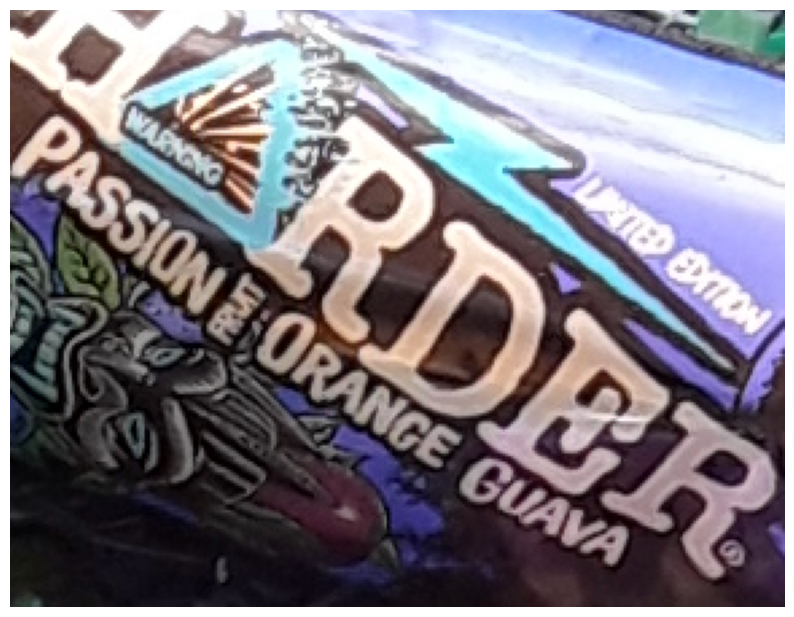

INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2','111','20','612','1671','858','1884','s3://olm-processed-s3/boxes/112/HKXafwXvrpBQjoWC9aPtSY8lTGcdoZVlPItqNQkK-612-1671-858-1884.jpg');
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2','111','20','1221','774','1296','903','s3://olm-processed-s3/boxes/112/HKXafwXvrpBQjoWC9aPtSY8lTGcdoZVlPItqNQkK-1221-774-1296-903.jpg');
INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('2','111','20','936','678','1224','900','s3://olm-processed-s3/boxes/112/HKXafwXvrpBQjoWC9aPtSY8lTGcdoZVlPItqNQkK-936-678-1224-900.jpg');


In [47]:
# Run the model inference on the test images
results = model(scaled_im_path + '/' + im_file, conf = 0.2)
boxes_df = pd.DataFrame(columns = ['image_id', 'brand_id', 'cat_id', 'xmin_coord', 'ymin_coord', 'xmax_coord', 'ymax_coord', 'box_pic_uri'])
for result in results: # Iterate over each picture 
    # Find the saceling factor
    w_ratio = image_original.shape[1]/image_scaled.shape[1]
    h_ratio = image_original.shape[0]/image_scaled.shape[0]
    for prediction in result.boxes.xyxy:   # Iterate over each box
        # Get the coordinates of the box on the original image
        xmin, ymin, xmax, ymax = map(int, prediction) 
        xmin = int(xmin * w_ratio)
        xmax = int(xmax * w_ratio)
        ymin = int(ymin * h_ratio)
        ymax = int(ymax * h_ratio)
        postfix = f"-{xmin}-{ymin}-{xmax}-{ymax}"
        box_file = im_file.split('.')[0]+postfix+'.jpg' 
        #print(box_file)
        # Get the section of the original image that is in the box
        box_im = image_original[ymin:ymax, xmin:xmax,:]
        # Save the box as an individual file
        cv2.imwrite(scaled_im_path + '/' + box_file, box_im)
        idx = len(boxes_df)
        boxes_df.loc[idx, 'brand_id'] = 111
        boxes_df.loc[idx, 'cat_id'] = 20
        boxes_df.loc[idx, 'xmin_coord'] = xmin
        boxes_df.loc[idx, 'ymin_coord'] = ymin
        boxes_df.loc[idx, 'xmax_coord'] = xmax
        boxes_df.loc[idx, 'ymax_coord'] = ymax
        boxes_df.loc[idx, 'image_id']= image_id
        boxes_df.loc[idx, 'box_pic_uri']= boxes_s3_path + box_file
        os.system(f"aws s3 cp {scaled_im_path + '/' + box_file} {boxes_s3_path}") 
    # Create a plot
    #plt.figure(figsize=(10, 10))
    #plt.imshow(box_im)
    #plt.axis('off') # Hide the axis
    #plt.show()
query = f'''
DELETE FROM box
WHERE image_id = {image_id}
'''
db_ops.run_single_query(query)
db_ops.add_df(boxes_df, "box")

In [48]:
boxes_df 

,image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri
0,2,111,20,612,1671,858,1884,s3://olm-processed-s3/boxes/112/HKXafwXvrpBQjo...
1,2,111,20,1221,774,1296,903,s3://olm-processed-s3/boxes/112/HKXafwXvrpBQjo...
2,2,111,20,936,678,1224,900,s3://olm-processed-s3/boxes/112/HKXafwXvrpBQjo...


INSERT INTO box (image_id,brand_id,cat_id,xmin_coord,ymin_coord,xmax_coord,ymax_coord,box_pic_uri) VALUES ('1','111','20','792','1112','932','1416','s3://olm-processed-s3/boxes/112/Pftq4550WzgZA5euhgIEsLHGs63tXSHAqCP07WKl-792-1112-932-1416.jpg');
